📊 FinBERT INDEX-score statistik:
count    9946.000000
mean        0.272743
std         0.423762
min        -0.929931
25%         0.003133
50%         0.304568
75%         0.636853
max         0.929029
Name: finbert_index_score, dtype: float64

🔍 Antal neutrale (score = 0.0):     0
🔺 Antal positive  (score > 0.0):     7503
🔻 Antal negative  (score < 0.0):     2443

📊 FinBERT UPDATED-score statistik:
count    9946.000000
mean        0.282215
std         0.435046
min        -0.930700
25%         0.007087
50%         0.316000
75%         0.668500
max         0.931600
Name: finbert_updated_score, dtype: float64

🔍 Antal neutrale (score = 0.0):     0
🔺 Antal positive  (score > 0.0):     7641
🔻 Antal negative  (sco):     2305


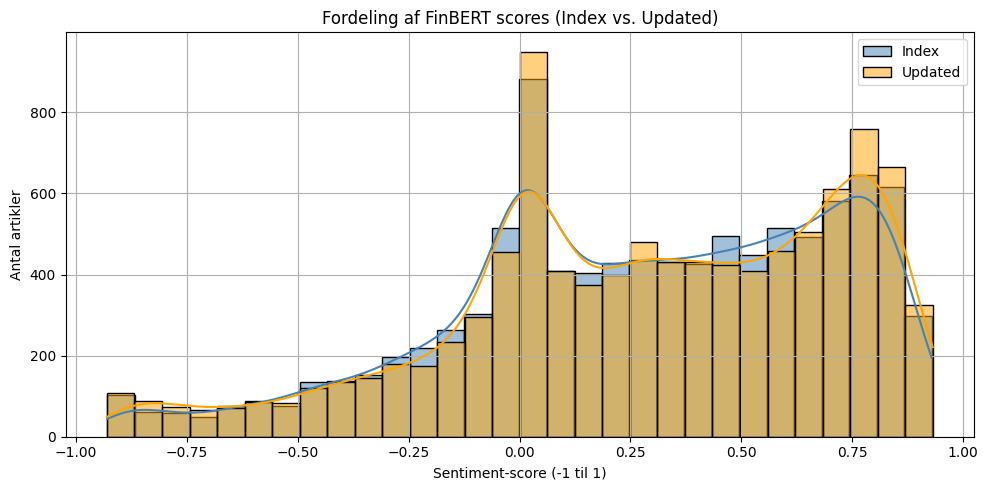

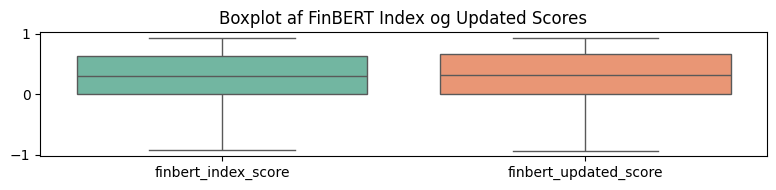

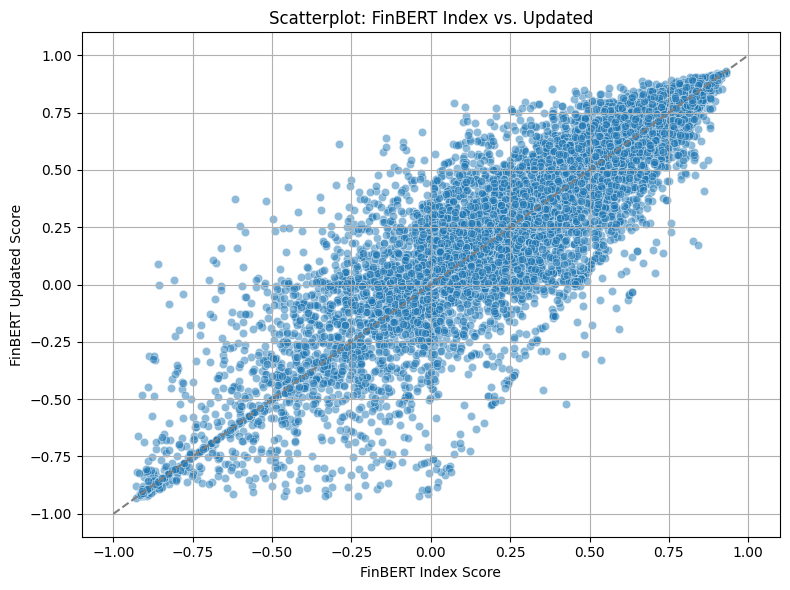

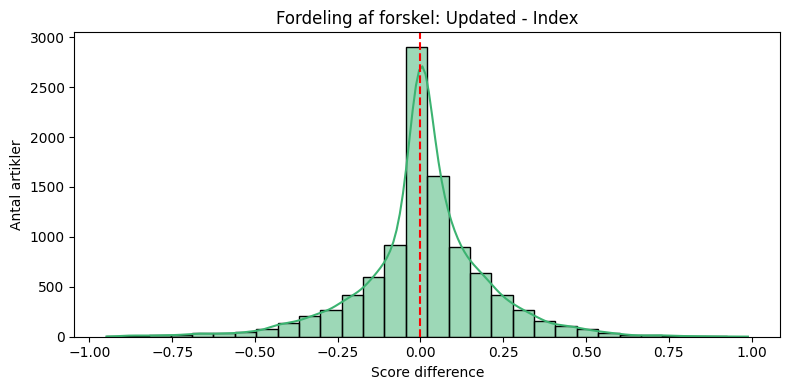

📈 Pearson-korrelation mellem Index og Updated: 0.8985


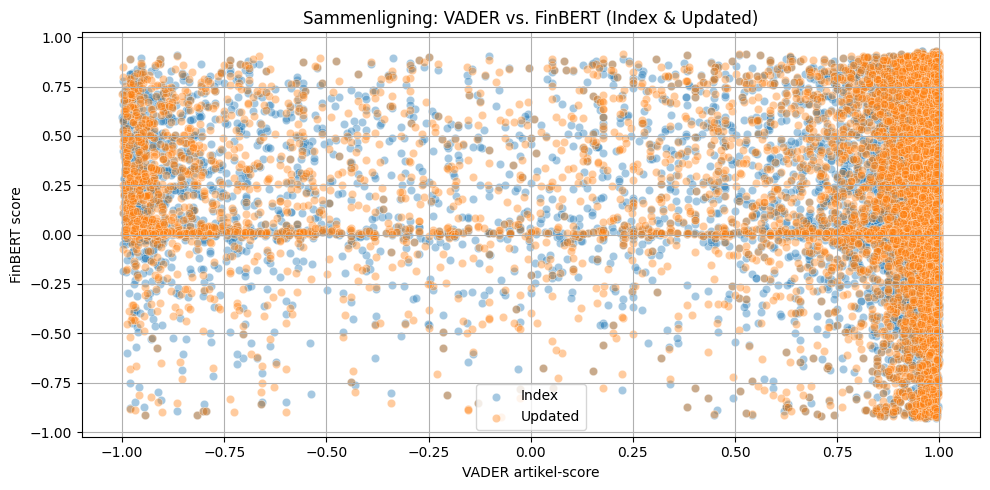

🔻 Mest negative artikler (Updated < -0.7):

🟥 Artikel (score: -0.931)
Titel: Bitfarms Increases Revenue by Almost 400% in Q2

Artikeltekst:
Canada-based bitcoin mining company Bitfarms (NASDAQ: BITF) reported Monday its sales grew 396% year over year to $36.7 million in the second quarter. It recorded an operating loss of $2.1 million and a net loss of $3.7 million for the quarter. Shares of Bitfarms were up 0.5% to $6.42 in after-hours trading on Monday following the release of its earnings. Shares are up almost 240% for the year to date as China has cracked down on crypto mining and the price of bitcoin has increased significantly. The company mined 759 bitcoin in Q2 with an average cost of approximately $9,000 per bitcoin, and held 1,293 bitcoin valued at $35,057 each, or approximately $45.3 million, as of June 30, 2021. Bitfarms average cost of production per bitcoin to $9,000 for the quarter compared to $5,075 for the prior year quarter reflected the May 2020 halving event and ex

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# === Filsti til dit datasæt ===
file_path = r"C:\Users\Kasper Hassing\Desktop\Speciale_KryptoSentiment\data\news_data\bitcoin_news_vader_firstfinbret_finbertupdated_scores.csv"

# === Indlæs og check ===
df = pd.read_csv(file_path)
if 'finbert_index_score' not in df.columns or 'finbert_updated_score' not in df.columns:
    raise ValueError("❌ Mangler en eller begge kolonner: 'finbert_index_score', 'finbert_updated_score'.")

# === Rens data ===
df = df.dropna(subset=['finbert_index_score', 'finbert_updated_score'])
finbert = df['finbert_index_score']
finbert_updated = df['finbert_updated_score']

# === Stats: Index Score ===
print("📊 FinBERT INDEX-score statistik:")
print(finbert.describe())
print(f"\n🔍 Antal neutrale (score = 0.0):     {(finbert == 0.0).sum()}")
print(f"🔺 Antal positive  (score > 0.0):     {(finbert > 0.0).sum()}")
print(f"🔻 Antal negative  (score < 0.0):     {(finbert < 0.0).sum()}")

# === Stats: Updated Score ===
print("\n📊 FinBERT UPDATED-score statistik:")
print(finbert_updated.describe())
print(f"\n🔍 Antal neutrale (score = 0.0):     {(finbert_updated == 0.0).sum()}")
print(f"🔺 Antal positive  (score > 0.0):     {(finbert_updated > 0.0).sum()}")
print(f"🔻 Antal negative  (sco):     {(finbert_updated < 0.0).sum()}")

# === Histogram + KDE ===
plt.figure(figsize=(10, 5))
sns.histplot(finbert, bins=30, kde=True, label='Index', color='steelblue')
sns.histplot(finbert_updated, bins=30, kde=True, label='Updated', color='orange')
plt.title("Fordeling af FinBERT scores (Index vs. Updated)")
plt.xlabel("Sentiment-score (-1 til 1)")
plt.ylabel("Antal artikler")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Boxplots ===
plt.figure(figsize=(8, 2))
sns.boxplot(data=df[['finbert_index_score', 'finbert_updated_score']], palette='Set2')
plt.title("Boxplot af FinBERT Index og Updated Scores")
plt.tight_layout()
plt.show()

# === Scatterplot: Index vs Updated ===
plt.figure(figsize=(8, 6))
sns.scatterplot(x=finbert, y=finbert_updated, alpha=0.5)
plt.plot([-1, 1], [-1, 1], linestyle='--', color='gray')  # 45° linje
plt.title("Scatterplot: FinBERT Index vs. Updated")
plt.xlabel("FinBERT Index Score")
plt.ylabel("FinBERT Updated Score")
plt.grid(True)
plt.tight_layout()
plt.show()

# === Histogram over forskelle ===
df['score_diff'] = df['finbert_updated_score'] - df['finbert_index_score']
plt.figure(figsize=(8, 4))
sns.histplot(df['score_diff'], bins=30, kde=True, color='mediumseagreen')
plt.axvline(0, color='red', linestyle='--')
plt.title("Fordeling af forskel: Updated - Index")
plt.xlabel("Score difference")
plt.ylabel("Antal artikler")
plt.tight_layout()
plt.show()

# === Korrelationskoefficient ===
correlation = finbert.corr(finbert_updated)
print(f"📈 Pearson-korrelation mellem Index og Updated: {correlation:.4f}")

# === Sammenlign med VADER hvis kolonne findes ===
if 'vader_article_score' in df.columns:
    plt.figure(figsize=(10, 5))
    sns.scatterplot(x=df['vader_article_score'], y=finbert, label='Index', alpha=0.4)
    sns.scatterplot(x=df['vader_article_score'], y=finbert_updated, label='Updated', alpha=0.4)
    plt.title("Sammenligning: VADER vs. FinBERT (Index & Updated)")
    plt.xlabel("VADER artikel-score")
    plt.ylabel("FinBERT score")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# === Mest negative artikler (Updated) ===
print("🔻 Mest negative artikler (Updated < -0.7):\n")
neg_df = df[df['finbert_updated_score'] < -0.7].sort_values('finbert_updated_score')
for i, row in neg_df.iterrows():
    print(f"🟥 Artikel (score: {row['finbert_updated_score']:.3f})")
    print(f"Titel: {row['title']}\n")
    print(f"Artikeltekst:\n{row['article_text']}\n")
    print("=" * 120)

# === Mest positive artikler (Updated) ===
print("\n🔺 Mest positive artikler (Updated > 0.6):\n")
pos_df = df[df['finbert_updated_score'] > 0.6].sort_values('finbert_updated_score', ascending=False)
for i, row in pos_df.iterrows():
    print(f"🟩 Artikel (score: {row['finbert_updated_score']:.3f})")
    print(f"Titel: {row['title']}\n")
    print(f"Artikeltekst:\n{row['article_text']}\n")
    print("=" * 120)